# CycleGAN Lab

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras as keras
import keras.layers as layers
from sklearn.model_selection import train_test_split
import random
import tensorflow_probability as tfp
import tensorflow_addons as tfa

In [3]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input, Conv2D, Flatten, Dense, Conv2DTranspose, Reshape, Lambda, Activation, BatchNormalization, LeakyReLU, Dropout, MaxPooling2D, UpSampling2D, Concatenate, InputLayer, Conv2DTranspose, Dropout, BatchNormalization, Activation
from keras.models import Model, Sequential
from keras import backend as K
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint 
from keras.utils import plot_model
import gc

In [4]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.filters import threshold_otsu
from glob import glob
from scipy import misc
from matplotlib.patches import Circle,Ellipse
from matplotlib.patches import Rectangle

In [5]:
import os
from PIL import Image
import scipy.misc
import imageio
from skimage.transform import rescale, resize
from skimage.color import lab2rgb

In [6]:
from matplotlib import pyplot as plt
import numpy as np
import gzip

In [7]:
tf.random.set_seed(42)

In [8]:
gc.collect()

73

# Data Augmentation

In [9]:
from tensorflow.keras.preprocessing import image_dataset_from_directory
from keras import backend as K
import tensorflow_addons as tfa
import tensorflow as tf

'''batch_size= 8
image_size = [120, 120]


ds = image_dataset_from_directory(
    '/kaggle/input/imagedataset/data',
    labels=None,
    image_size=image_size,
    interpolation='nearest',
    batch_size=batch_size,
    shuffle=True,
    color_mode='grayscale'
)

def convert_to_float(image):
    image = tf.image.convert_image_dtype(image, dtype=tf.float32)
    return image


def trans1(img):
    return tfa.image.rotate(tf.image.flip_left_right(tf.image.flip_up_down(img)),-.2,fill_mode="reflect",interpolation="bilinear")

def trans2(img):
    return tfa.image.rotate(img,-.2,fill_mode="reflect",interpolation="bilinear")

def trans3(img):
    return tfa.image.rotate(img,.2,fill_mode="reflect",interpolation="bilinear")
    
ds1,ds2,ds3,ds4 = ds,ds.map(trans1),ds.map(trans2),ds.map(trans3)

ds = ds1.concatenate(ds2).concatenate(ds3).concatenate(ds4)

AUTOTUNE = tf.data.experimental.AUTOTUNE
x = (
    ds
    .map(convert_to_float)
    .cache()
    .prefetch(buffer_size=AUTOTUNE)
)'''

'batch_size= 8\nimage_size = [120, 120]\n\n\nds = image_dataset_from_directory(\n    \'/kaggle/input/imagedataset/data\',\n    labels=None,\n    image_size=image_size,\n    interpolation=\'nearest\',\n    batch_size=batch_size,\n    shuffle=True,\n    color_mode=\'grayscale\'\n)\n\ndef convert_to_float(image):\n    image = tf.image.convert_image_dtype(image, dtype=tf.float32)\n    return image\n\n\ndef trans1(img):\n    return tfa.image.rotate(tf.image.flip_left_right(tf.image.flip_up_down(img)),-.2,fill_mode="reflect",interpolation="bilinear")\n\ndef trans2(img):\n    return tfa.image.rotate(img,-.2,fill_mode="reflect",interpolation="bilinear")\n\ndef trans3(img):\n    return tfa.image.rotate(img,.2,fill_mode="reflect",interpolation="bilinear")\n    \nds1,ds2,ds3,ds4 = ds,ds.map(trans1),ds.map(trans2),ds.map(trans3)\n\nds = ds1.concatenate(ds2).concatenate(ds3).concatenate(ds4)\n\nAUTOTUNE = tf.data.experimental.AUTOTUNE\nx = (\n    ds\n    .map(convert_to_float)\n    .cache()\n    .p

In [10]:
ab_path = "/kaggle/input/image-colorization/ab/ab/ab1.npy"
l_path = "/kaggle/input/image-colorization/l/gray_scale.npy"

In [11]:
Y = np.load(ab_path)[0:3000]
X = np.load(l_path)[0:3000]
gc.collect()

85

In [12]:
x = []
y = []

In [13]:
for i in X:
    x.append(cv2.resize(i, dsize=(256, 256), interpolation=cv2.INTER_CUBIC))
    #x.append(np.resize(i, (224, 224)))
for i in Y:
    y.append(cv2.resize(i, dsize=(256, 256), interpolation=cv2.INTER_CUBIC))
    #y.append(np.resize(i, (224, 224, 2)))


In [14]:
x = np.array(x)
y = np.array(y)

In [15]:
x_reshaped = np.repeat(x.reshape(-1, 256, 256, 1), 2, axis = 3)

In [16]:
del X
del Y

In [17]:
y.shape

(3000, 256, 256, 2)

In [18]:
x_reshaped.shape

(3000, 256, 256, 2)

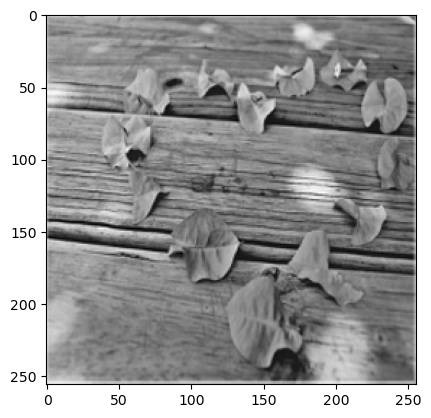

In [19]:
plt.imshow(x_reshaped[1,:,:,0], cmap="gray")

In [20]:
def lab_to_rgb(L, ab):
    """
    Takes an image or a batch of images and converts from LAB space to RGB
    """
    L = L  * 100
    ab = (ab - 0.5) * 128 * 2
    Lab = np.concatenate([L, ab], dim=2).numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = Image.lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)

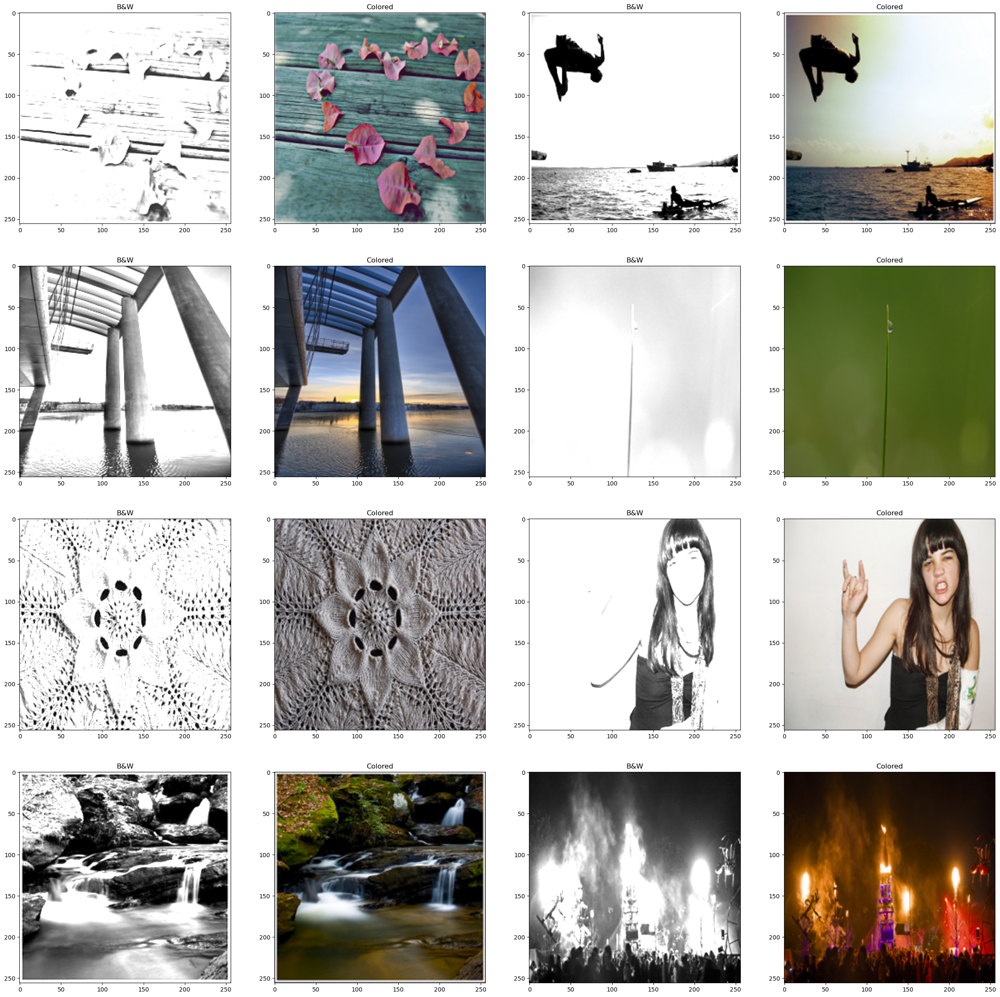

In [21]:
plt.figure(figsize=(30,30))
for i in range(1,16,2):
    plt.subplot(4,4,i)
    img = np.zeros((256,256,3))
    img[:,:,0] = x[i]
    plt.title('B&W')
    plt.imshow(lab2rgb(img))
    
    plt.subplot(4,4,i+1)
    img[:,:,1:] = y[i]
    img = img.astype('uint8')
    img = cv2.cvtColor(img, cv2.COLOR_LAB2RGB)
    plt.title('Colored')
    plt.imshow(img)

In [22]:
"""x = []
y = []
def read_images(data): #method to read images
    for i in range(len(data)):
        rgb_image = Image.open( data[i] ).resize( ( img_size , img_size ) )
        # Normalize the RGB image array
        rgb_img_array = (np.asarray( rgb_image ) ) / 255
        gray_image = rgb_image.convert( 'L' )
        # Normalize the grayscale image array
        gray_img_array = ( np.asarray( gray_image ).reshape( ( img_size , img_size , 1 ) ) ) / 255
        # Append both the image arrays
        x.append( gray_img_array )
        y.append( rgb_img_array )
    return x,y"""

"x = []\ny = []\ndef read_images(data): #method to read images\n    for i in range(len(data)):\n        rgb_image = Image.open( data[i] ).resize( ( img_size , img_size ) )\n        # Normalize the RGB image array\n        rgb_img_array = (np.asarray( rgb_image ) ) / 255\n        gray_image = rgb_image.convert( 'L' )\n        # Normalize the grayscale image array\n        gray_img_array = ( np.asarray( gray_image ).reshape( ( img_size , img_size , 1 ) ) ) / 255\n        # Append both the image arrays\n        x.append( gray_img_array )\n        y.append( rgb_img_array )\n    return x,y"

In [23]:
"""x, y = read_images(data) #calling readimage"""

'x, y = read_images(data) #calling readimage'

In [24]:
x_reshaped = (x_reshaped/255).astype('float32') 
y = (y/255).astype('float32') 

In [25]:
#plt.imshow(y[0])

In [26]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

train_x, test_x, train_y, test_y = train_test_split( x_reshaped , y , test_size=0.1, random_state=42 )

In [27]:
del x
del y
del x_reshaped

In [28]:
lr = 0.00005

In [29]:
# Define the generator model for grayscale to color image translation
def build_generator():
    input_img = Input(shape=(256, 256, 2))

    # Encoder
    conv1 = Conv2D(64, 4, strides=2, padding='same')(input_img)
    lrelu1 = LeakyReLU(alpha=0.2)(conv1)

    conv2 = Conv2D(128, 4, strides=2, padding='same')(lrelu1)
    bn2 = BatchNormalization()(conv2)
    lrelu2 = LeakyReLU(alpha=0.2)(bn2)

    conv3 = Conv2D(256, 4, strides=2, padding='same')(lrelu2)
    bn3 = BatchNormalization()(conv3)
    lrelu3 = LeakyReLU(alpha=0.2)(bn3)

    conv4 = Conv2D(512, 4, strides=2, padding='same')(lrelu3)
    bn4 = BatchNormalization()(conv4)
    lrelu4 = LeakyReLU(alpha=0.2)(bn4)

    conv5 = Conv2D(512, 4, strides=2, padding='same')(lrelu4)
    bn5 = BatchNormalization()(conv5)
    lrelu5 = LeakyReLU(alpha=0.2)(bn5)

    conv6 = Conv2D(512, 4, strides=2, padding='same')(lrelu5)
    bn6 = BatchNormalization()(conv6)
    lrelu6 = LeakyReLU(alpha=0.2)(bn6)

    conv7 = Conv2D(512, 4, strides=2, padding='same')(lrelu6)
    bn7 = BatchNormalization()(conv7)
    lrelu7 = LeakyReLU(alpha=0.2)(bn7)

    conv8 = Conv2D(512, 4, strides=2, padding='same')(lrelu7)
    bn8 = BatchNormalization()(conv8)
    lrelu8 = LeakyReLU(alpha=0.2)(bn8)

    # Decoder
    conv9 = Conv2D(512, 4, strides=2, padding='same')(lrelu8)
    bn9 = BatchNormalization()(conv9)
    relu9 = Activation('relu')(bn9)
    dropout9 = Dropout(0.5)(relu9)

    upconv10 = Conv2DTranspose(512, 4, strides=2, padding='same')(dropout9)
    upbn10 = BatchNormalization()(upconv10)
    uprelu10 = Activation('relu')(upbn10)
    updrop10 = Dropout(0.5)(uprelu10)
    upcat10 = Concatenate()([updrop10, lrelu7])

    upconv11 = Conv2DTranspose(512, 4, strides=2, padding='same')(upcat10)
    upbn11 = BatchNormalization()(upconv11)
    uprelu11 = Activation('relu')(upbn11)
    updrop11 = Dropout(0.5)(uprelu11)
    upcat11 = Concatenate()([updrop11, lrelu6])
    
    upconv12 = Conv2DTranspose(512, 4, strides=2, padding='same')(upcat11)
    upbn12 = BatchNormalization()(upconv12)
    uprelu12 = Activation('relu')(upbn12)
    updrop12 = Dropout(0.5)(uprelu12)
    upcat12 = Concatenate()([updrop12, lrelu5])

    upconv13 = Conv2DTranspose(256, 4, strides=2, padding='same')(upcat12)
    upbn13 = BatchNormalization()(upconv13)
    uprelu13 = Activation('relu')(upbn13)
    upcat13 = Concatenate()([uprelu13, lrelu4])

    upconv14 = Conv2DTranspose(128, 4, strides=2, padding='same')(upcat13)
    upbn14 = BatchNormalization()(upconv14)
    uprelu14 = Activation('relu')(upbn14)
    upcat14 = Concatenate()([uprelu14, lrelu3])

    upconv15 = Conv2DTranspose(64, 4, strides=2, padding='same')(upcat14)
    upbn15 = BatchNormalization()(upconv15)
    uprelu15 = Activation('relu')(upbn15)
    upcat15 = Concatenate()([uprelu15, lrelu2])
    
    upconv16 = Conv2DTranspose(64, 4, strides=2, padding='same')(upcat15)
    upbn16 = BatchNormalization()(upconv16)
    uprelu16 = Activation('relu')(upbn16)
    upcat16 = Concatenate()([uprelu16, lrelu1])

    upconv17 = Conv2DTranspose(2, 4, strides=2, padding='same')(upcat16)
    output = Activation('tanh')(upconv17)

    return Model(inputs=input_img, outputs=output)

In [30]:
def build_discriminator():
    
    input_img = Input(shape=(256, 256, 2))
    conv1 = Conv2D(64, 4, strides=2, padding='same')(input_img)
    lrelu1 = LeakyReLU(alpha=0.2)(conv1)

    conv2 = Conv2D(128, 4, strides=2, padding='same')(lrelu1)
    bn2 = BatchNormalization()(conv2)
    lrelu2 = LeakyReLU(alpha=0.2)(bn2)

    conv3 = Conv2D(256, 4, strides=2, padding='same')(lrelu2)
    bn3 = BatchNormalization()(conv3)
    lrelu3 = LeakyReLU(alpha=0.2)(bn3)

    conv4 = Conv2D(512, 4, strides=1, padding='same')(lrelu3)
    bn4 = BatchNormalization()(conv4)
    lrelu4 = LeakyReLU(alpha=0.2)(bn4)

    output = Conv2D(1, 4, strides=1, padding='same', activation='sigmoid')(lrelu4)

    return Model(inputs=input_img, outputs=output)


In [31]:
def cycle_loss(real_image, generated_image):
    loss = tf.reduce_mean(tf.abs(real_image - generated_image))
    return loss

def discriminator_loss(real, generated):
    real_loss = tf.keras.losses.binary_crossentropy(tf.ones_like(real), real)
    generated_loss = tf.keras.losses.binary_crossentropy(tf.zeros_like(generated), generated)
    total_loss = real_loss + generated_loss
    return total_loss

def generator_loss(generated):
    return tf.keras.losses.binary_crossentropy(tf.ones_like(generated), generated)

def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5 * loss

In [32]:
generator_optimizer = tf.keras.optimizers.legacy.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.legacy.Adam(2e-4, beta_1=0.5)

In [33]:
class CycleGAN(tf.keras.Model):
    def __init__(self, generator_g, generator_f, discriminator_x, discriminator_y, **kwargs):
        super(CycleGAN, self).__init__(**kwargs)
        self.generator_g = generator_g
        self.generator_f = generator_f
        self.discriminator_x = discriminator_x
        self.discriminator_y = discriminator_y
        
    def compile(self, generator_optimizer, discriminator_optimizer, cycle_loss_fn, identity_loss_fn, generator_loss_fn, discriminator_loss_fn):
        super(CycleGAN, self).compile()
        self.generator_optimizer = generator_optimizer
        self.discriminator_optimizer = discriminator_optimizer
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        self.generator_loss_fn = generator_loss_fn
        self.discriminator_loss_fn = discriminator_loss_fn

    def train_step(self, batch_data):
        real_x, real_y = batch_data

        with tf.GradientTape(persistent=True) as tape:
            # Forward pass through generators
            fake_y = self.generator_g(real_x, training=True)
            cycled_x = self.generator_f(fake_y, training=True)
            fake_x = self.generator_f(real_y, training=True)
            cycled_y = self.generator_g(fake_x, training=True)

            # Identity mapping
            same_x = self.generator_f(real_x, training=True)
            same_y = self.generator_g(real_y, training=True)

            # Discriminator outputs
            disc_real_x = self.discriminator_x(real_x, training=True)
            disc_fake_x = self.discriminator_x(fake_x, training=True)
            disc_real_y = self.discriminator_y(real_y, training=True)
            disc_fake_y = self.discriminator_y(fake_y, training=True)

            # Generator losses
            gen_g_loss = self.generator_loss_fn(disc_fake_y)
            gen_f_loss = self.generator_loss_fn(disc_fake_x)
            cycle_loss = self.cycle_loss_fn(real_x, cycled_x) + self.cycle_loss_fn(real_y, cycled_y)
            identity_loss = self.identity_loss_fn(real_x, same_x) + self.identity_loss_fn(real_y, same_y)
            total_gen_g_loss = gen_g_loss + cycle_loss + identity_loss
            total_gen_f_loss = gen_f_loss + cycle_loss + identity_loss

            # Discriminator losses
            disc_x_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Compute gradients and update weights for generators
        gen_g_gradients = tape.gradient(total_gen_g_loss, self.generator_g.trainable_variables)
        gen_f_gradients = tape.gradient(total_gen_f_loss, self.generator_f.trainable_variables)

        self.generator_optimizer.apply_gradients(zip(gen_g_gradients, self.generator_g.trainable_variables))
        self.generator_optimizer.apply_gradients(zip(gen_f_gradients, self.generator_f.trainable_variables))

        # Compute gradients and update weights for discriminators
        disc_x_gradients = tape.gradient(disc_x_loss, self.discriminator_x.trainable_variables)
        disc_y_gradients = tape.gradient(disc_y_loss, self.discriminator_y.trainable_variables)
        
        self.discriminator_optimizer.apply_gradients(zip(disc_x_gradients, self.discriminator_x.trainable_variables))
        self.discriminator_optimizer.apply_gradients(zip(disc_y_gradients, self.discriminator_y.trainable_variables))

        return {
            "gen_g_loss": total_gen_g_loss,
            "gen_f_loss": total_gen_f_loss,
            "disc_x_loss": disc_x_loss,
            "disc_y_loss": disc_y_loss
        }


In [34]:
generator_g = build_generator()
generator_f = build_generator()

In [35]:
discriminator_x = build_discriminator()
discriminator_y = build_discriminator()

In [36]:
cycle_gan_model = CycleGAN(
    generator_g,
    generator_f,
    discriminator_x,
    discriminator_y
)

In [37]:
generator_f.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 2  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_9 (Conv2D)              (None, 128, 128, 64  2112        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 leaky_re_lu_8 (LeakyReLU)      (None, 128, 128, 64  0           ['conv2d_9[0][0]']               
                                )                                                           

In [38]:
cycle_gan_model.compile(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    cycle_loss_fn=tf.keras.losses.MeanAbsoluteError(),
    identity_loss_fn=identity_loss,
    generator_loss_fn=generator_loss,
    discriminator_loss_fn=discriminator_loss
)

In [40]:
cycle_gan_model.load_weights("/kaggle/input/cycleweight80/cycleGAN_weights80.h5")

In [ ]:
cycle_gan_model.fit(
    train_x,
    train_y,
    epochs=20,
    batch_size = 4
)

Epoch 1/20


2023-04-19 04:57:09.011830: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


675/675 [==============================] - 276s 379ms/step - gen_g_loss: 1.9956 - gen_f_loss: 2.5239 - disc_x_loss: 0.7783 - disc_y_loss: 0.9763
Epoch 2/20
675/675 [==============================] - 255s 378ms/step - gen_g_loss: 2.1121 - gen_f_loss: 2.4982 - disc_x_loss: 0.7213 - disc_y_loss: 0.8644
Epoch 3/20
675/675 [==============================] - 255s 378ms/step - gen_g_loss: 2.0085 - gen_f_loss: 2.7490 - disc_x_loss: 0.6355 - disc_y_loss: 0.8655
Epoch 4/20
675/675 [==============================] - 255s 378ms/step - gen_g_loss: 2.0497 - gen_f_loss: 2.9445 - disc_x_loss: 0.5444 - disc_y_loss: 0.8839
Epoch 5/20
675/675 [==============================] - 255s 378ms/step - gen_g_loss: 2.2842 - gen_f_loss: 3.0270 - disc_x_loss: 0.5172 - disc_y_loss: 0.8390
Epoch 6/20
675/675 [==============================] - 255s 378ms/step - gen_g_loss: 2.3148 - gen_f_loss: 2.7790 - disc_x_loss: 0.6606 - disc_y_loss: 0.7612
Epoch 7/20
675/675 [==============================] - 255s 378ms/step - gen

In [41]:
gc.collect()

45851

In [47]:
cycle_gan_model.save_weights('cycleGAN_weights80.h5')

In [39]:
pred = cycle_gan_model(test_x)

NotImplementedError: Exception encountered when calling layer 'cycle_gan' (type CycleGAN).

Unimplemented `tf.keras.Model.call()`: if you intend to create a `Model` with the Functional API, please provide `inputs` and `outputs` arguments. Otherwise, subclass `Model` with an overridden `call()` method.

Call arguments received by layer 'cycle_gan' (type CycleGAN):
  • inputs=tf.Tensor(shape=(300, 256, 256, 2), dtype=float32)
  • training=None
  • mask=None

In [46]:
pred = cycle_gan_model.generator_g(test_x)

NotImplementedError: Exception encountered when calling layer 'cycle_gan' (type CycleGAN).

Unimplemented `tf.keras.Model.call()`: if you intend to create a `Model` with the Functional API, please provide `inputs` and `outputs` arguments. Otherwise, subclass `Model` with an overridden `call()` method.

Call arguments received by layer 'cycle_gan' (type CycleGAN):
  • inputs=tf.Tensor(shape=(300, 256, 256, 2), dtype=float32)
  • training=None
  • mask=None

In [ ]:
# Convert the images to numpy arrays
# img1 = tf.keras.preprocessing.image.img_to_array(pred[0])
# img2 = tf.keras.preprocessing.image.img_to_array(test_y[0])
final = []
predfinal = []
for i in range(600):
    img = np.zeros((224,224,3))
    img[:,:,0] = test_x[i]*255
    img[:,:,1:] = pred[i]*255
    img = img.astype('uint8')
    img = cv2.cvtColor(img, cv2.COLOR_LAB2RGB)
    #img = img.reshape(1, 224, 224, 3)
    #img = np.expand_dims(img, axis=0)
    img_y = np.zeros((224,224,3))
    img_y[:,:,0] = test_x[0]*255
    img_y[:,:,1:] = test_y[0]*255
    img_y = img_y.astype('uint8')
    img_y = cv2.cvtColor(img_y, cv2.COLOR_LAB2RGB)
    final.append(img)
    predfinal.append(img_y)
#img_y = img_y.reshape(1, 224, 224, 3)
#img_y = np.expand_dims(img_y, axis=0)

In [ ]:
# Calculate SSIM between the two images
ssimtotal = 0
for i in range(600):
    ssim_val1 = ssim(predfinal[i,:,:,0], final[i,:,:,0])
    ssim_val2 = ssim(predfinal[i,:,:,1], final[i,:,:,0])
    ssim_val3 = ssim(predfinal[i,:,:,2], final[i,:,:,0])
    ssimtotal = ssimtotal + (ssim_val1 + ssim_val2 + ssim_val3)/3


# Print the SSIM value
print('SSIM:', ssimtotal/600)

In [ ]:
def r_accuracy(img_original, img_reconstructed):
    mse = tf.reduce_mean((img_original - img_reconstructed) ** 2)
    pixel_max = 1.0
    psnr = 20 * tf.math.log(pixel_max / tf.math.sqrt(mse))/tf.math.log(10.0)
    return psnr

In [ ]:
"""del x
del y
del L_df
del ab_df"""

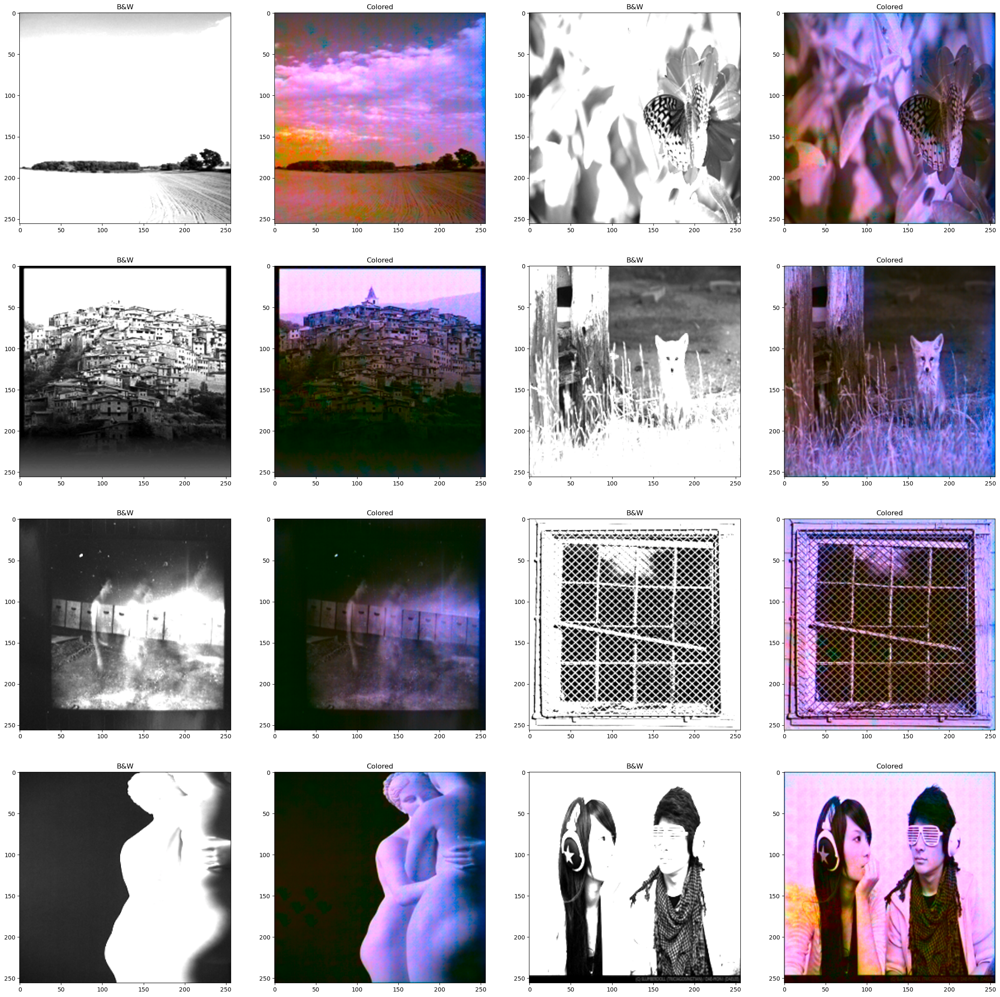

In [51]:
plt.figure(figsize=(30,30))
for i in range(1,16,2):
    plt.subplot(4,4,i)
    img = np.zeros((256,256,3))
    img[:,:,0] = test_x[i,:,:,0]*255
    plt.title('B&W')
    plt.imshow(lab2rgb(img))
    
    plt.subplot(4,4,i+1)
    img[:,:,1:] = pred[i]*255
    img = img.astype('uint8')
    img = cv2.cvtColor(img, cv2.COLOR_LAB2RGB)
    plt.title('Colored')
    plt.imshow(img)

ValueError: could not broadcast input array from shape (256,256,2) into shape (224,224)

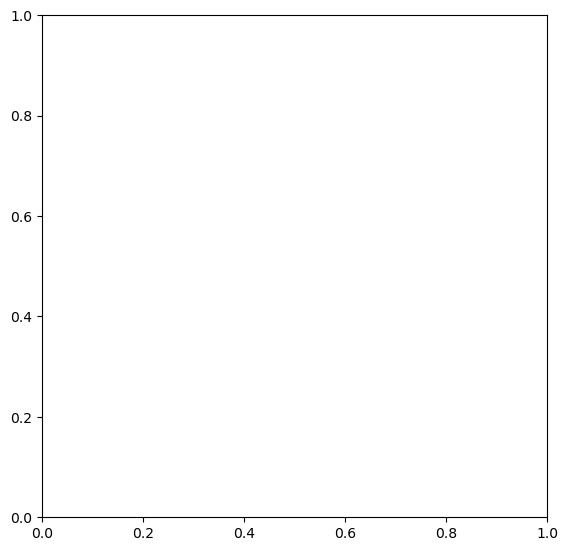

In [44]:
plt.figure(figsize=(30,30))
for i in range(1,16,2):
    plt.subplot(4,4,i)
    img = np.zeros((224,224,3))
    img[:,:,0] = test_x[i]*255
    plt.title('B&W')
    plt.imshow(lab2rgb(img))
    
    plt.subplot(4,4,i+1)
    img[:,:,1:] = pred[i]*255
    img = img.astype('uint8')
    img = cv2.cvtColor(img, cv2.COLOR_LAB2RGB)
    plt.title('Colored')
    plt.imshow(img)

In [ ]:
plt.imshow(pred[2])

In [ ]:
plt.imshow(pred[20])

In [ ]:
model1.save_weights("weightsvaelab.h5")

In [ ]:
model1.load_weights('weights')

In [ ]:
model1.score(test_x, test_y)